# Overview

This notebook is a walkthrough of the steps of Cygnus, for those who want to get more familiar with the components. 




# Libs

In [19]:
suppressPackageStartupMessages({
    library(cygnus)

    ## Consider adding dependencies
    library(Matrix)
    library(dplyr)
    library(data.table)
    library(purrr)

    ## Remove these dependencies 
    library(RSpectra)
    library(sf) ## my own polygons, sf only for plotting? 
    library(mclust) ## mclustBIC. Just use RcppArmadillo's version 

    ## Move to suggests 
    ## (for vignette only, not method)
    library(ggthemes)
    library(viridis)
    library(glue)
    library(patchwork)
    library(ggplot2)
    library(ComplexHeatmap)
})

fig.size <- function(h, w) {
    options(repr.plot.height = h, repr.plot.width = w)
}



# Parameters

In [20]:
verbose = TRUE
show_plots = TRUE

###### STEP 0 ######
npcs = 10
## Graph pruning
prune_thresh_quantile = 0.95
prune_min_cells = 10


###### STEP 1: GRADIENTS ######
smooth_distance = c('none', 'euclidean', 'projected', 'constant')[3] 
smooth_similarity = c('none', 'euclidean', 'projected', 'constant')[3] 


###### STEP 2: DMT ######
## ... no options


###### STEP 3: AGGREGATION ######
max_npts = 50
min_npts = 5
alpha = 1 ## 0.2 = conservative merging, 2 = liberal merging 



# Data

Small sample MERFISH dataset from Chen et al: 

https://www.biorxiv.org/content/10.1101/2023.04.04.535379v1.abstract


In [21]:
counts = readRDS('../data/counts1.rds')
meta_data = readRDS('../data/meta1.rds')
meta_vars_include = c('type_lvl1', 'type_lvl2', 'hubID')


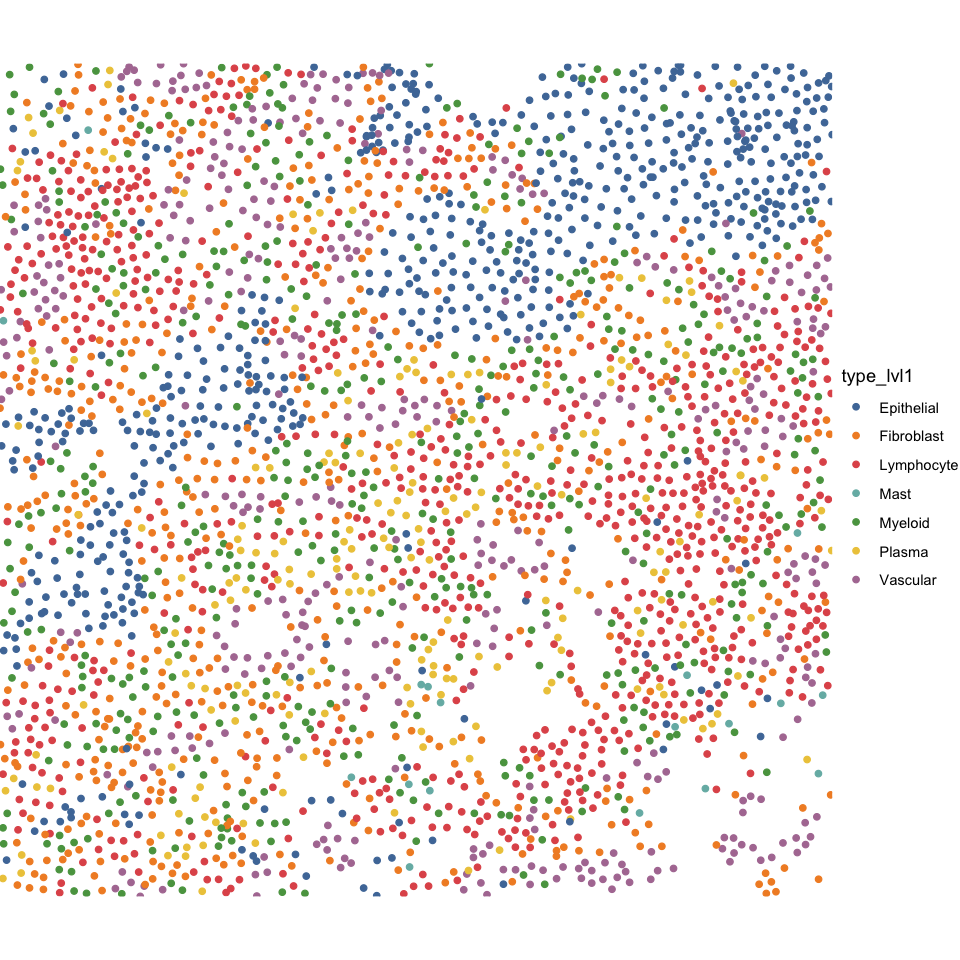

In [22]:
fig.size(8, 8)
ggplot() + 
    geom_point(data = meta_data, aes(X, Y, color = type_lvl1)) + 
    theme_void() + 
    scale_color_tableau() + 
    coord_sf(expand = FALSE) + 
    NULL


Some coarse and fine grained cell types are predefined here, to help interpret the tiles we get below. 

In [23]:
table(meta_data$type_lvl1)


Epithelial Fibroblast Lymphocyte       Mast    Myeloid     Plasma   Vascular 
       634        588        829         18        491        206        411 

In [24]:
table(meta_data$type_lvl2)


                           B               CD1C+ITGAX+ DC 
                          46                           12 
                       CD4 T                        CD8 T 
                         351                           61 
          CXCL10+ Macrophage                CXCL13+ CD4 T 
                          34                           27 
               CXCL13+ CD8 T                   Epithelial 
                           6                          634 
        FCN1+LYZ+ Macrophage                   Fibroblast 
                          11                          588 
                    FLT3+ DC       FOLR2+CD14+ Macrophage 
                           8                          113 
                         ILC         LAMP3+CCL19+ mreg DC 
                          63                           29 
              LAMP3+CD1C+ DC            MARCO+ Macrophage 
                           6                           18 
                        Mast            MERTK+ Macropha

## prepare

In [25]:
dmt = init_data(meta_data$X, meta_data$Y, counts, meta_data, meta_vars_include)
dmt = prune_graph(dmt, thresh_quantile = prune_thresh_quantile, mincells = prune_min_cells) 

In [27]:
dmt = add_exterior_triangles(dmt)

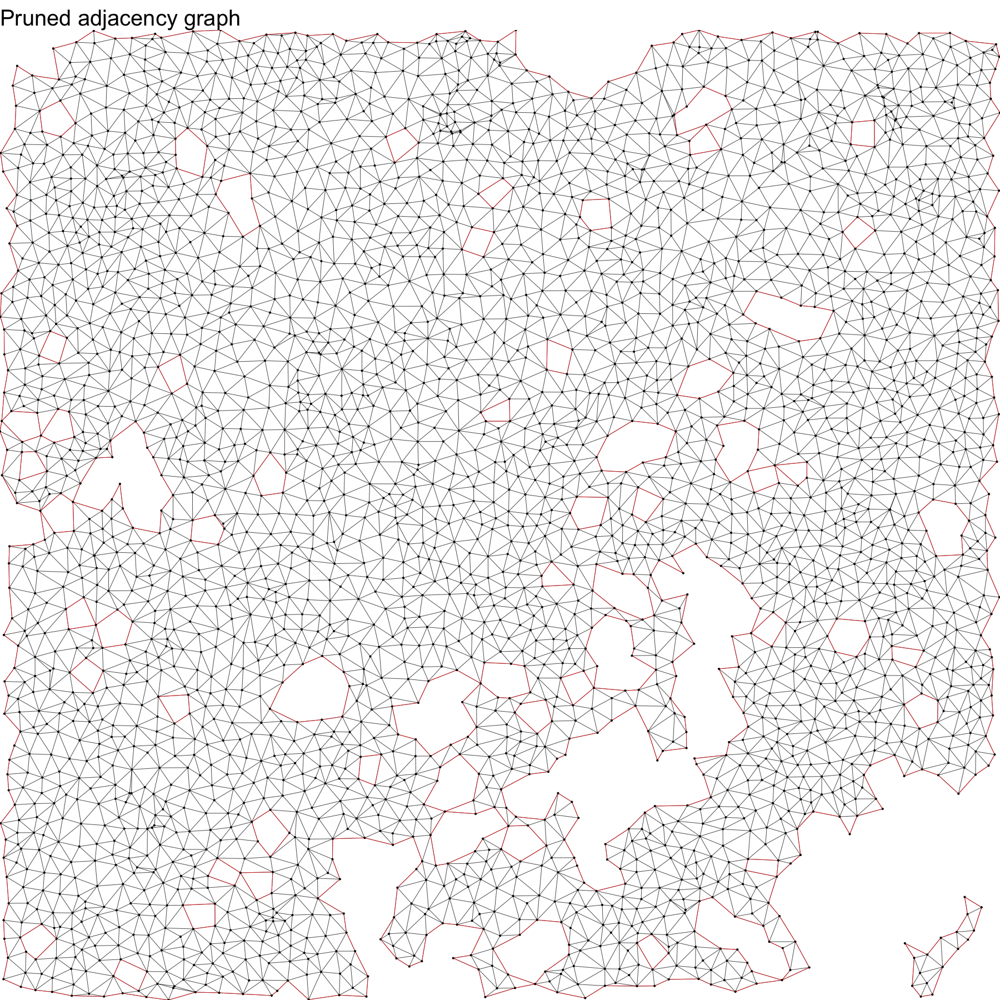

In [28]:
fig.size(15, 15)
# fig.size(20, 20)

if (show_plots) {    
    ggplot() + 
    
        # ## big data 
        # geom_point(data = dmt$pts, aes(X, Y), shape = '.', alpha = .1) + 
        # geom_segment(data = dmt$edges[boundary == TRUE], aes(x = x0_pt, y = y0_pt, xend = x1_pt, yend = y1_pt), color = 'red', lwd = .2) + 
    
        ## small data 
        geom_segment(data = dmt$edges, aes(x = x0_pt, y = y0_pt, xend = x1_pt, yend = y1_pt), color = 'black', lwd = .2) + 
        geom_segment(data = dmt$edges[boundary == TRUE], aes(x = x0_pt, y = y0_pt, xend = x1_pt, yend = y1_pt), color = 'red', lwd = .2) + 
        geom_point(data = dmt$pts, aes(X, Y), size = .5) + 
    
        theme_void(base_size = 20) + 
        coord_cartesian(expand = FALSE) + 
        labs(title = 'Pruned adjacency graph') + 
        NULL
}


## pca

In [29]:
dmt$udv_cells = do_pca(dmt$counts, npcs)


# Step 1: compute gradients on all data structures

In [30]:
field = compute_gradients(dmt, smooth_distance, smooth_similarity)
field = compress_gradients_svd(field)


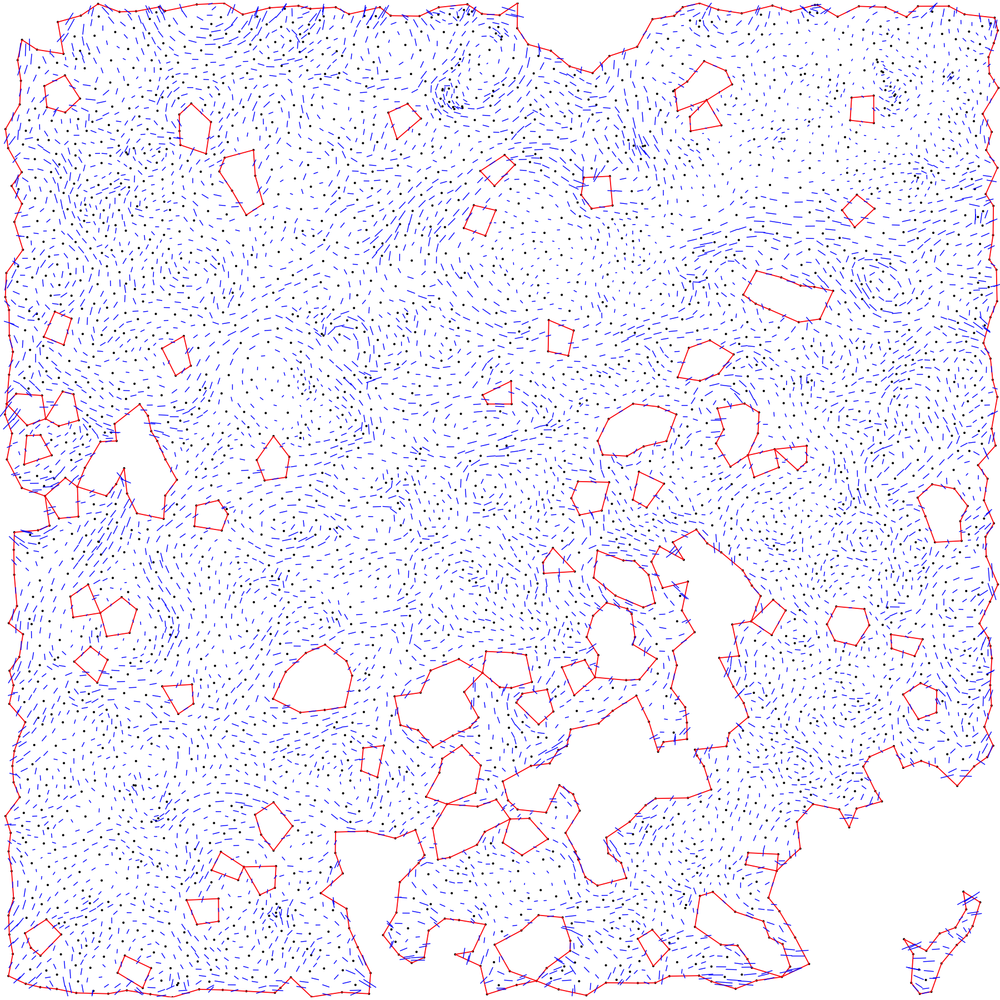

In [31]:
if (show_plots) {    

    len_plot_constant = .8
    fig.size(15, 15)
    # fig.size(20, 20)
    ggplot() + 
        geom_point(data = dmt$pts, aes(X, Y), size = .5) + 
        geom_segment(data = dmt$edges[boundary == TRUE, ], aes(x = x0_pt, y = y0_pt, xend = x1_pt, yend = y1_pt), color = 'red') + 
    
        ## Triangle Gradients
        geom_segment(
            data = data.table(dmt$tris, field$tris_svd), 
            aes(
                x=X-len_plot_constant*(len_grad+len_ortho)*dx_ortho, 
                y=Y-len_plot_constant*(len_grad+len_ortho)*dy_ortho, 
                xend=X+len_plot_constant*(len_grad+len_ortho)*dx_ortho, 
                yend=Y+len_plot_constant*(len_grad+len_ortho)*dy_ortho
            ), 
            linewidth = .4, alpha = 1, 
            color = 'blue'
        ) + 
    
        theme_void() + 
        coord_fixed(expand = FALSE) + 
        NULL
}


# Step 2: DMT


## compute f

In [32]:
dmt = dmt_set_f(dmt, field)

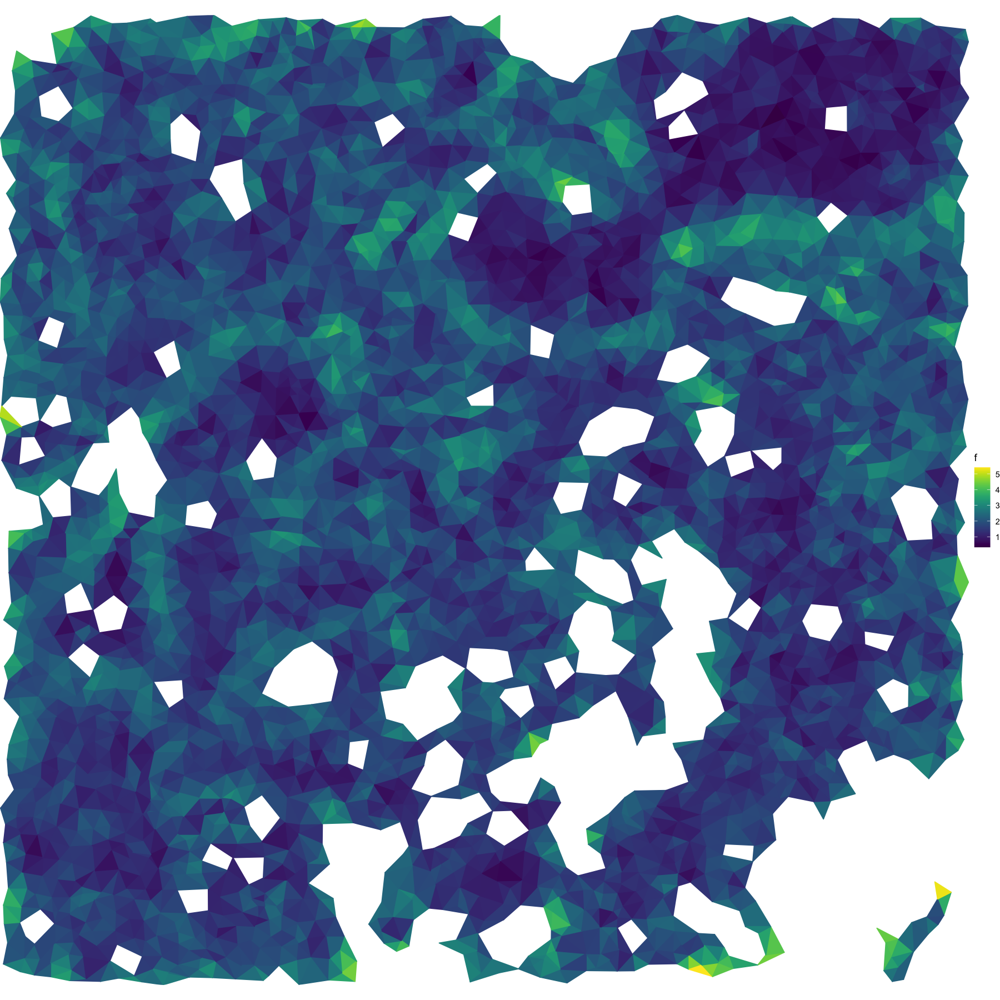

In [33]:
if (show_plots) {    
    ntri = max(which(dmt$tris$external == FALSE))
    i = t(dmt$tri_to_pt[1:ntri, ])@i+1
    plt_df = data.table(
        X = dmt$pts$X[i],
        Y = dmt$pts$Y[i],
        f = rep(dmt$tris$f[1:ntri], each = 3)
    )[
        , id := rep(1:ntri, each = 3)
    ][]
    
    
    fig.size(15, 15)
    ggplot() + 
        geom_polygon(data = plt_df, aes(X, Y, group = id, fill = f, color = f)) + 
        theme_void() + 
        coord_fixed(expand = FALSE) + 
        scale_fill_viridis() + 
        scale_color_viridis() + 
        NULL
}

## forests

In [34]:
dmt$prim = do_primary_forest(dmt)
dmt$dual = do_dual_forest(dmt)


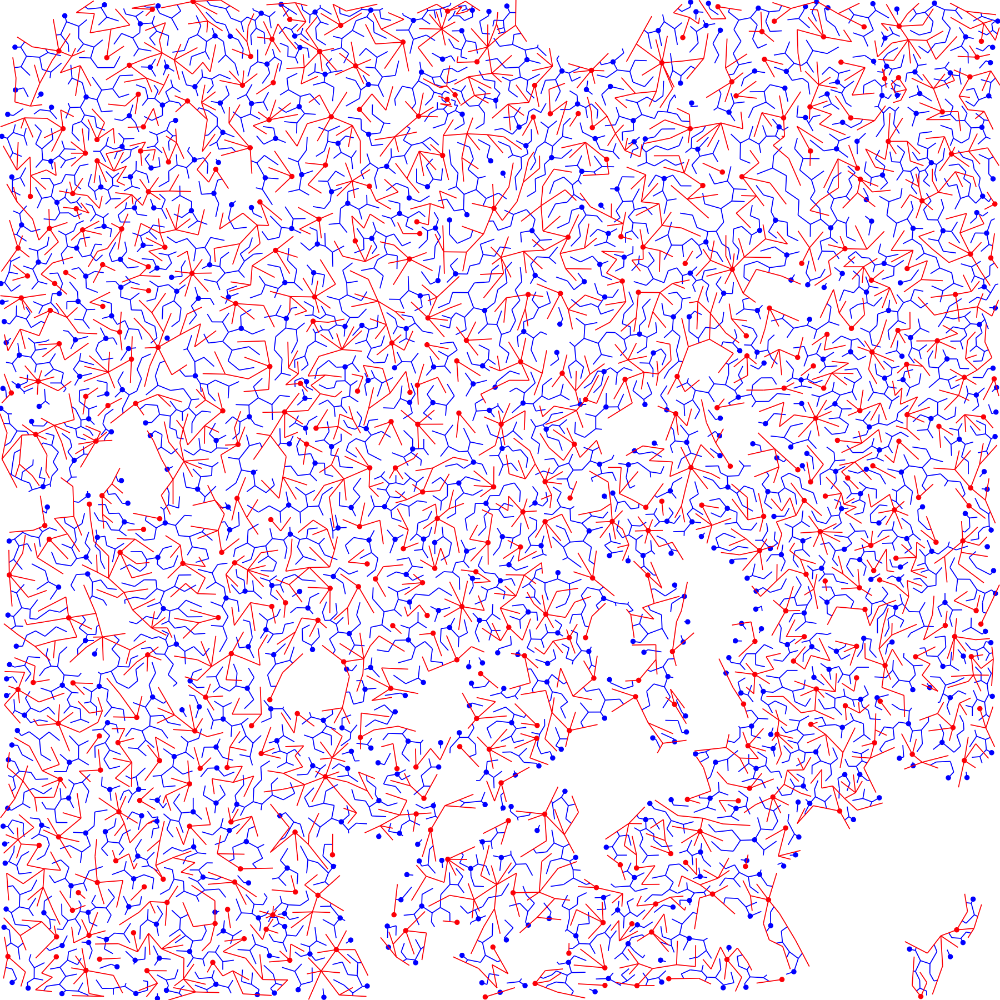

In [35]:
if (show_plots) {    
    fig.size(15, 15)
    ggplot() +     
        ## primary forest
        geom_point(data = dmt$tris[dmt$dual$maxima, ], aes(X, Y), color = 'blue', size = 2) + 
        geom_segment(data = dmt$dual$edges, aes(x=x0, y=y0, xend=x1, yend=y1), color = 'blue') + 

        ## primary forest
        geom_point(data = dmt$pts[dmt$prim$minima, ], aes(X, Y), color = 'red', size = 2) + 
        geom_segment(data = dmt$prim$edges, aes(x=x0, y=y0, xend=x1, yend=y1), color = 'red') + 
    
        theme_void() + 
        coord_cartesian(expand = FALSE) + 
        NULL
}


## extract epaths

In [36]:
dmt$e_sep = dmt_get_separatrices(dmt)

After DMT, we have a separatrix (in blue) and the primary forest connecting points (in red). 


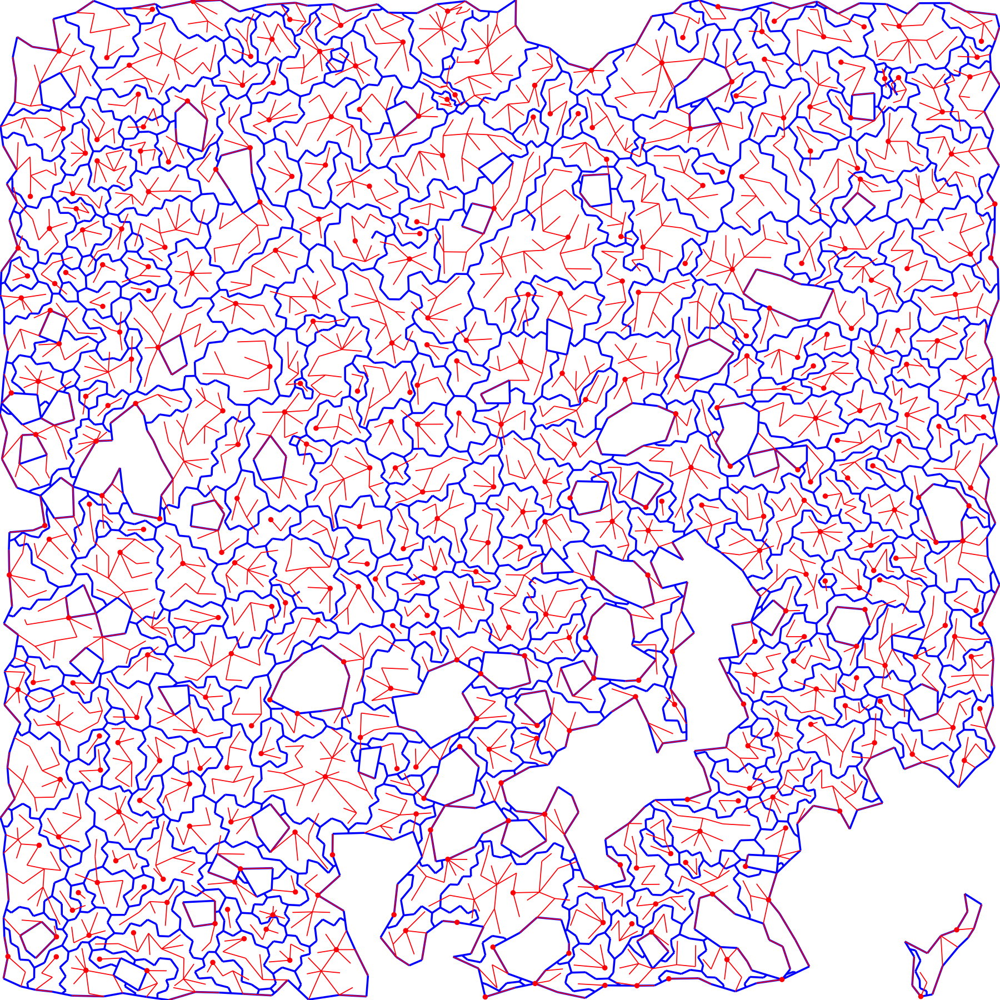

In [37]:
if (show_plots) {    
    fig.size(15, 15)
    ggplot() + 
    
        geom_segment(data = dmt$edges[dmt$e_sep, ], aes(x = x0_tri, y = y0_tri, xend = x1_tri, yend = y1_tri), lwd = 1, color = 'blue') + 
        geom_segment(data = dmt$edges[boundary == TRUE], aes(x = x0_pt, y = y0_pt, xend = x1_pt, yend = y1_pt), color = 'blue', lwd = 1) + 
    
        ## primary forest
        geom_point(data = dmt$pts[dmt$prim$minima, ], aes(X, Y), color = 'red', size = 2) + 
        geom_segment(data = dmt$prim$edges, aes(x=x0, y=y0, xend=x1, yend=y1), color = 'red') + 
    
        theme_void() + 
        coord_cartesian(expand = FALSE) + 
        NULL
}

## extract tiles



In [38]:
dmt = dmt_assign_tiles(dmt)
aggs = dmt_init_tiles(dmt)

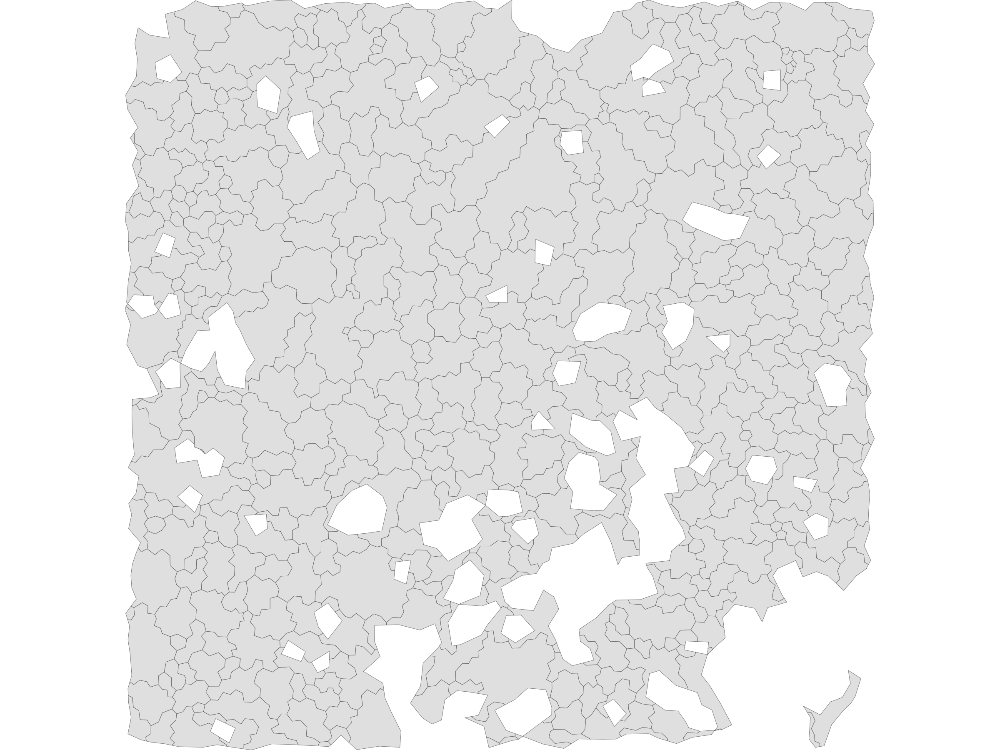

In [39]:
if (show_plots) {    
    set.seed(2)
    fig.size(15, 20)
    ggplot() + 
        geom_sf(data = aggs$meta_data$shape) + 
        # geom_point(data = dmt$pts, aes(X, Y, color = factor(agg_id, sample(nrow(aggs$meta_data)))), size = 1) + 
        # scale_color_tableau() + 
        theme_void() + 
        coord_sf(expand = FALSE) + 
        # coord_cartesian(expand = FALSE) + 
        guides(color = 'none') + 
        
        NULL 
}

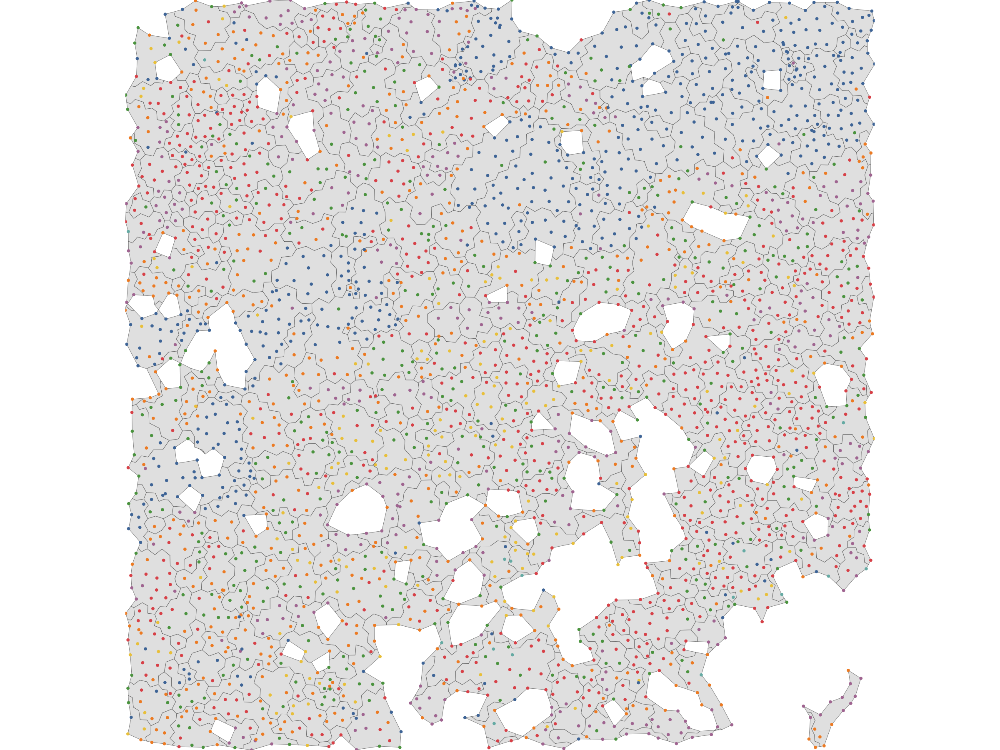

In [40]:
if (show_plots) {    
    set.seed(2)
    fig.size(15, 20)
    ggplot() + 
        geom_sf(data = aggs$meta_data$shape) + 
        geom_point(data = dmt$pts, aes(X, Y, color = type_lvl1)) + 
        theme_void() + 
        coord_sf(expand = FALSE) + 
        scale_color_tableau() + 
        guides(color = 'none') + 
        NULL 
}

# Step 3: Aggregation

## Merge main

First, merge similar aggregates that are nearby. 


In [41]:
aggs = init_scores(aggs, agg_mode=2, alpha=alpha, max_npts=max_npts)
aggs = merge_aggs(aggs, agg_mode=2, max_npts=max_npts)
dmt = update_dmt_aggid(dmt, aggs)
aggs = update_agg_shapes(dmt, aggs)

## Merge small outliers

Then go ahead and merge small clusters that are smaller than 


In [42]:
aggs = init_scores(aggs, agg_mode=3, alpha=alpha, min_npts=min_npts)
aggs = merge_aggs(aggs, agg_mode=3, min_npts=min_npts)
dmt = update_dmt_aggid(dmt, aggs)
aggs = update_agg_shapes(dmt, aggs)

## Final tiles 

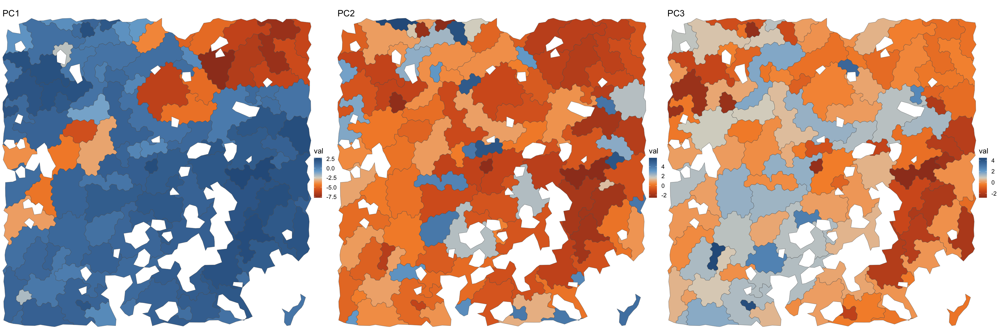

In [43]:
fig.size(10, 30)
if (show_plots) { 
    purrr::map(1:3, function(i) {
        ggplot(cbind(aggs$meta_data, val=aggs$pcs[, i])) + 
            geom_sf(aes(geometry = shape, fill = val)) + 
            theme_void(base_size = 16) + 
            coord_sf(expand = FALSE) + 
            scale_fill_gradient2_tableau() + 
            guides(color = 'none') + 
            labs(title = glue('PC{i}')) + 
            NULL 
    }) %>% 
        purrr::reduce(`|`)
}

# Results

In [44]:
head(aggs$meta_data)

id,X,Y,npts,shape,area,perimeter
<int>,<dbl>,<dbl>,<dbl>,<GEOMETRY>,<dbl>,<dbl>
1,5575.126,10072.15,43,POLYGON ((5598.428 10051.98...,3028.5702,393.79103
2,5551.504,10104.73,35,POLYGON ((5572.969 10116.07...,2320.2439,270.48266
3,5577.735,10114.87,8,POLYGON ((5572.969 10116.07...,651.2121,139.60497
4,5565.044,10019.62,41,"POLYGON ((5614.379 10006.3,...",2292.7048,317.27844
5,5534.221,10048.70,7,POLYGON ((5537.904 10040.62...,387.4860,87.17964
6,5515.949,10052.62,33,POLYGON ((5513.932 10008.66...,2012.1687,252.01537


In [45]:
head(dmt$pts)

X,Y,ORIG_ID,type_lvl1,type_lvl2,hubID,f,agg_id
<dbl>,<dbl>,<int>,<chr>,<chr>,<chr>,<dbl>,<int>
5575.161,10049.24,1,Epithelial,Epithelial,H924,1.270484,1
5548.940,10058.77,2,Epithelial,Epithelial,H856,1.165277,1
5549.603,10101.12,3,Lymphocyte,CD4 T,H856,1.498917,2
5570.112,10099.79,4,Myeloid,MERTK+ Macrophage,H856,1.723642,3
5552.255,10001.83,5,Myeloid,FOLR2+CD14+ Macrophage,H924,2.399105,4
5553.034,10034.65,6,Myeloid,MERTK+ Macrophage,H924,2.157448,4
